<a href="https://colab.research.google.com/github/NjokiMbugua/Hypothesis-testing/blob/main/DSC9_Independent_Project_Week_4_Njoki_Mbugua.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1.0 Exploratory Data Analysis and documentation

### a. Defining the Question
The research problem was to determine whether the number of blue cars taken from postal code 75015 on weekends is the same as number of bluecars taken on postal code 75017 weekends.

### b. Defining the Metric for Success


* Perform a Univariate analysis
*   Perform a Bivariate analysis
*   Perform hypothesis testing




### c. Understanding the context
Perform a background search to understand the data including studying the data set attributes for proper planning of the analysis. The data set at hand was accompanied by a detailed and clear description which coupled with desk research provided a rich preview of the data.

### d. Recording the experimental design
 The approach taken in the EDA which include
*   data understanding
*   variable identification
*   data cleaning (anomalies, missing values, outliers)
*   data analysis(univariate,bivariate)
*   hypothesis testing and reporting
















### e. Data relevance.
Checking whether is relevant to the topic of study and adequate enough to answer the research question.

# 2.0 Importing the Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats


# 3.0 Loading the dataset

In [2]:
# Load the dataset
# Url = /content/autolib_daily_events_postal_code.csv
autolib=pd.read_csv('/content/autolib_daily_events_postal_code.csv')
autolib.head()

,Postal code,date,n_daily_data_points,dayOfWeek,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
0,75001,1/1/2018,1440,0,weekday,110,103,3,2,10,9,22,20
1,75001,1/2/2018,1438,1,weekday,98,94,1,1,8,8,23,22
2,75001,1/3/2018,1439,2,weekday,138,139,0,0,2,2,27,27
3,75001,1/4/2018,1320,3,weekday,104,104,2,2,9,8,25,21
4,75001,1/5/2018,1440,4,weekday,114,117,3,3,6,6,18,20


# 4.0 Previewing and cleaning the data

In [3]:
# Checking the shape of the dataset
autolib.shape

(16085, 13)

In [4]:
# Checking the data information
#
autolib.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16085 entries, 0 to 16084
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Postal code             16085 non-null  int64 
 1   date                    16085 non-null  object
 2   n_daily_data_points     16085 non-null  int64 
 3   dayOfWeek               16085 non-null  int64 
 4   day_type                16085 non-null  object
 5   BlueCars_taken_sum      16085 non-null  int64 
 6   BlueCars_returned_sum   16085 non-null  int64 
 7   Utilib_taken_sum        16085 non-null  int64 
 8   Utilib_returned_sum     16085 non-null  int64 
 9   Utilib_14_taken_sum     16085 non-null  int64 
 10  Utilib_14_returned_sum  16085 non-null  int64 
 11  Slots_freed_sum         16085 non-null  int64 
 12  Slots_taken_sum         16085 non-null  int64 
dtypes: int64(11), object(2)
memory usage: 1.6+ MB


In [5]:
# Checking the columns
#
autolib.columns

Index(['Postal code', 'date', 'n_daily_data_points', 'dayOfWeek', 'day_type',
       'BlueCars_taken_sum', 'BlueCars_returned_sum', 'Utilib_taken_sum',
       'Utilib_returned_sum', 'Utilib_14_taken_sum', 'Utilib_14_returned_sum',
       'Slots_freed_sum', 'Slots_taken_sum'],
      dtype='object')

In [6]:
# Changing column names to lower case and replacing white spaces
autolib.columns = autolib.columns.str.lower().str.replace(' ', '_')
autolib.head(0)

,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum,utilib_taken_sum,utilib_returned_sum,utilib_14_taken_sum,utilib_14_returned_sum,slots_freed_sum,slots_taken_sum


In [7]:
# Checking for anomalies/unique values
#
n = autolib.nunique(axis=0)
  
print("No.of.unique values in each column :\n",
      n)

No.of.unique values in each column :
 postal_code               104
date                      156
n_daily_data_points        23
dayofweek                   7
day_type                    2
bluecars_taken_sum        932
bluecars_returned_sum     929
utilib_taken_sum           48
utilib_returned_sum        49
utilib_14_taken_sum        92
utilib_14_returned_sum     94
slots_freed_sum           297
slots_taken_sum           301
dtype: int64


In [8]:
# Get a series object containing the count of unique elements
    # in each column of dataframe
uniqueValues = autolib.nunique()
print('Count of unique values in each column :')
print(uniqueValues)

Count of unique values in each column :
postal_code               104
date                      156
n_daily_data_points        23
dayofweek                   7
day_type                    2
bluecars_taken_sum        932
bluecars_returned_sum     929
utilib_taken_sum           48
utilib_returned_sum        49
utilib_14_taken_sum        92
utilib_14_returned_sum     94
slots_freed_sum           297
slots_taken_sum           301
dtype: int64


In [9]:
# Checking for duplicates.
autolib.duplicated().sum()

0

In [10]:
# Checking for Missing values
#
autolib.isnull().sum()

postal_code               0
date                      0
n_daily_data_points       0
dayofweek                 0
day_type                  0
bluecars_taken_sum        0
bluecars_returned_sum     0
utilib_taken_sum          0
utilib_returned_sum       0
utilib_14_taken_sum       0
utilib_14_returned_sum    0
slots_freed_sum           0
slots_taken_sum           0
dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


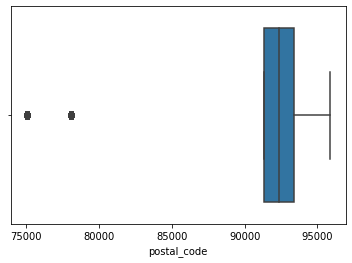

In [11]:
# Checking for outliers
sns.boxplot(autolib['postal_code'])


In [12]:
# Using Pandas profiling to check the data and generate descpritive statistics
!pip install pandas-profiling==2.7.1
import pandas_profiling
prof = pandas_profiling.ProfileReport(df=autolib)
prof

     |████████████████████████████████| 256kB 17.5MB/s 
     |████████████████████████████████| 61kB 6.6MB/s 
     |████████████████████████████████| 81kB 9.4MB/s 
     |████████████████████████████████| 1.1MB 20.3MB/s 
     |████████████████████████████████| 3.2MB 36.4MB/s 
     |████████████████████████████████| 296kB 44.2MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27085 sha256=0d65e8c8dbca5cf78d65f4f087c355adee77a3f90a74155ad780cde1a5838beb
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107413 sha256=c5290794a663c248229b38167708a28b2e6b8bbc60dd43a552b9410dd9543910
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d85653789e80e966c3bf6
Successfully built htmlmin phik
ERROR: phik 0.11.2 has requirement scipy>=1.5.2, but you'll have scipy 1.4.1 which is incompatible.
  Found existing i

Summarize dataset:   0%|          | 0/25 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 5.0 Univariate analysis

In [13]:
# Previewing the data set
autolib.tail(3)

,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum,utilib_taken_sum,utilib_returned_sum,utilib_14_taken_sum,utilib_14_returned_sum,slots_freed_sum,slots_taken_sum
16082,95880,6/17/2018,1440,6,weekend,33,35,1,1,0,0,0,0
16083,95880,6/18/2018,1440,0,weekday,11,14,3,5,2,2,0,0
16084,95880,6/19/2018,1370,1,weekday,2,2,2,1,0,0,0,0


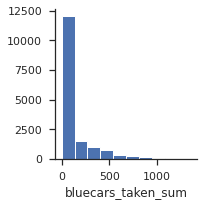

In [14]:
# A histogram of bluecars taken
sns.set(style='ticks', color_codes=True)
bt_hist = sns.FacetGrid(autolib)
bt_hist.map(plt.hist, 'bluecars_taken_sum', bins=10)


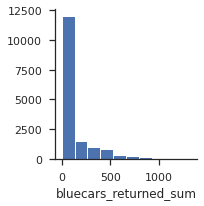

In [15]:
# Histogram of bluecars returned.
sns.set(style='ticks', color_codes=True)
bt_hist = sns.FacetGrid(autolib)
bt_hist.map(plt.hist, 'bluecars_returned_sum', bins=10)
#plt.title(Histogram of bluecars returned)

# 6.0 Bivariate analysis.

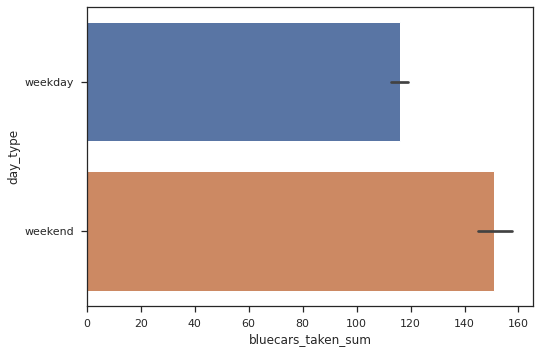

In [16]:
# A barplot of bluecars taken versus day type
sns.barplot(x = 'bluecars_taken_sum',
            y = 'day_type',
            data = autolib)
 
# Show the plot
plt.show()

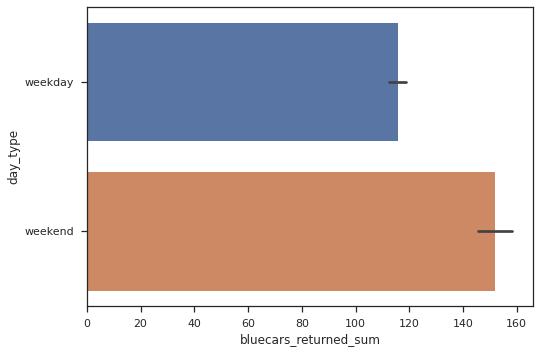

In [17]:
# Bar plot showing bluecars returned vs day type
sns.barplot(x = 'bluecars_returned_sum',
            y = 'day_type',
            data = autolib)
 
# Show the plot
plt.show()

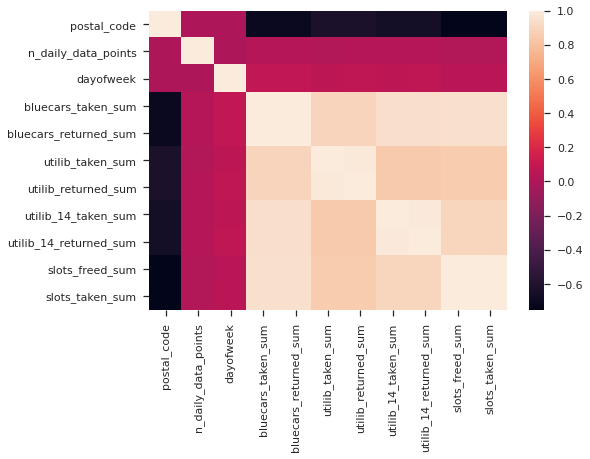

In [18]:
# Calculating the correlation
sns.heatmap(autolib.corr(),annot=False)
plt.show()

## 6.1 Interpretation.
Blue cars were more utilized during the weekend as compared to the weekdays. The rate of borrowing was the same as the rate of returning the cars. 

# 7.0 Hypothesis testing

## 7.1 Problem Statement
Working as a Data Scientist for the Autolib electric car-sharing service company to investigate a claim about the blue cars, we did a hypothesis testing to try and answer the question on whether the number of blue cars taken on weekdays same as number of bluecars taken on weekends. 
Our null and alternative hypothesis were as follows:

*   Ho: The number of Bluecars taken from postal code 75015 is the same as in 
postal code 75017 during weekends.
*   Ha: The number of Bluecars taken from postal code 75015 is different from that of postal code 75017 during weekends.



## 7.2 Data description
For this project we used the availed dataset  by the company. 
 
* The autolib description(an excel dataset which contained a detailed description of the actual data)
*   The autolib data set was the actual data used for analysis during this project((a csv file that contains useful information on the hours of operation, postal code, dates,time,days of operation(weekdays and weekends), number of cars operating(bluecars,utilib,utilib4), charging slots, name of the stations and their rental status).

Our variables of interest were bluecars, days of operations(Weekdays/weekends), and the postal code from which the cars were operating. The dataset was filtered to achieve a new dataframe showing only the operations for the bluecars on the weekends.


In [19]:
# Filtering the dataset to have weekdays only
weekendsdf= autolib[autolib['day_type']=='weekend'] 
weekendsdf.head(5)

,postal_code,date,n_daily_data_points,dayofweek,day_type,bluecars_taken_sum,bluecars_returned_sum,utilib_taken_sum,utilib_returned_sum,utilib_14_taken_sum,utilib_14_returned_sum,slots_freed_sum,slots_taken_sum
5,75001,1/6/2018,1437,5,weekend,187,185,6,6,7,8,38,35
6,75001,1/7/2018,1440,6,weekend,180,180,2,2,10,9,34,34
12,75001,1/13/2018,1440,5,weekend,224,223,2,2,15,15,38,38
13,75001,1/14/2018,1440,6,weekend,193,193,2,2,12,12,22,20
19,75001,1/20/2018,1439,5,weekend,217,217,2,2,25,25,41,39


In [20]:
# Checking the shape of the dataset
weekendsdf.shape

(4541, 13)

In [21]:
# Hypothesis testing
# Is the number of blue cars taken on weekdays same as number of bluecars taken on weekends?
# Ho: The number of Bluecars taken from postal code 75015 is the same as in postal code 75017 during weekends.
# Ha: The number of Bluecars taken from postal code 75015 is different from that of postal code 75017 during weekends.

## 7.3 Hypothesis Testing Procedure
The hypothesis was tested about the mean of the bluecar borrowing/leasing during the weekends. The first step involved determining the sample size
The sample size was calculated using an online sample size calculator. For a known population (4541 rows for weekends) at 95% confidence interval and a margin error of 5% the sample size was automatically generated to yield n=355.
The next step was the sampling process. Simple random sampling was applied to generate a sample. After generating the sample size, the sample mean and standard deviation for the blue cars was determined. We already had yielded population mean from the descriptive statistics(Exploratory Data Analysis).
Since the sample size was greater than 30, and we had calculated the standard deviation, a Z-test was therefore found to be the most applicable test statistic for this project. The p-value was determined at α=0.05 at 95% confidence interval.

In [22]:
# Determining the sample size
# Using a sample size calculator.
# For a known population (4541 rows for weekends) at 95% confidence interval and a margin error of 5% 
# the sample size was automatically generated to yield n=355

In [23]:
# Using simple random sampling to generate a sample
sample = weekendsdf.sample(n=355,replace='False')
print(sample)

       postal_code       date  ...  slots_freed_sum  slots_taken_sum
2086         75014   3/3/2018  ...              177              173
2664         75018  1/13/2018  ...              154              157
1275         75009  1/28/2018  ...               92               93
6843         92250   6/2/2018  ...                5                5
7444         92300  4/29/2018  ...                0                0
...            ...        ...  ...              ...              ...
3531         78000  4/14/2018  ...                0                0
9600         92600  4/15/2018  ...                0                0
14336        94220   5/6/2018  ...                0                0
11138        93260  4/28/2018  ...                8                8
10874        93230   1/7/2018  ...                0                0

[355 rows x 13 columns]


In [24]:
# Calculating the mean for blue cars taken
sample.bluecars_taken_sum.mean()

159.0225352112676

In [25]:
# Calculating the standard deviation for blue cars taken
sample.bluecars_taken_sum.std()

222.47424671449429

In [26]:
# Since our sample is greater than 30 and we have calculated the standard deviation we use z-test to test our hypothesis
# Population mean = 
#z = (x — μ) / (σ / √n)
zscore = (143.69-125.93)/(197.31/355**(1/2))
zscore

1.6959304636458452

In [27]:
#
import scipy.stats

#find p-value for two-tailed test
scipy.stats.norm.sf(abs(1.695))*2
#p_value = stats.norm.pdf(abs(z_score_max))*2 # two - sided test
# The p value of 0.09 is 9%. This means there is a 9% chance the results could be random (i.e. happened by chance).

0.09007542078206292

In [28]:
# P- value is 0.09
# Using alpha = 0.05
# 0.09 > 0.05 
# The p-value is greater than alpha so we fail to reject the null hypothesis.

## 7.4 Hypothesis testing results and interpretation

*   P- value is 0.09 for a two tailed test.
*   Z-score=1.6959. 


*  Using alpha = 0.05
*  0.09 > 0.05 
 
The p-value is greater than alpha so we fail to reject the null hypothesis. And therefore conclude that the number of bluecars taken from postal code 75015 during the weekends is the same as the number of bluecars taken from postal code 75017 during the weekends.
